In [15]:
import numpy as np
import nibabel as nib
import glob
import random
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from tifffile import imsave
import os
import splitfolders
from sklearn.preprocessing import MinMaxScaler
from typing import List, Tuple, Generator
from matplotlib import pyplot as plt
from keras.models import Model
from keras.layers import Input, Conv3D, MaxPooling3D, concatenate, Conv3DTranspose, BatchNormalization, Dropout, Lambda
from keras.optimizers import Adam
from keras.metrics import MeanIoU
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

scaler = MinMaxScaler()


In [ ]:
pip install split-folders

In [2]:
pip install nibabel

Defaulting to user installation because normal site-packages is not writeable







   ---------------------------------------- 0.0/3.3 MB ? eta -:--:--

   ---------------------------------------- 0.0/3.3 MB ? eta -:--:--

   ---------------------------------------- 0.0/3.3 MB 660.6 kB/s eta 0:00:05

   - -------------------------------------- 0.1/3.3 MB 980.4 kB/s eta 0:00:04

   -- ------------------------------------- 0.2/3.3 MB 1.4 MB/s eta 0:00:03

   ---- ----------------------------------- 0.4/3.3 MB 2.1 MB/s eta 0:00:02

   ------ --------------------------------- 0.6/3.3 MB 2.4 MB/s eta 0:00:02

   --------- ------------------------------ 0.7/3.3 MB 2.6 MB/s eta 0:00:01

   ----------- ---------------------------- 0.9/3.3 MB 2.9 MB/s eta 0:00:01

   ------------ --------------------------- 1.1/3.3 MB 2.8 MB/s eta 0:00:01

   --------------- ------------------------ 1.3/3.3 MB 3.0 MB/s eta 0:00:01

   ----------------- ---------------------- 1.5/3.3 MB 3.1 MB/s eta 0:00:01

 

DEPRECATION: Loading egg at c:\programdata\anaconda3\lib\site-packages\vboxapi-1.0-py3.12.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330


In [4]:
pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable










































   ---------------------------------------- 0.0/385.2 MB ? eta -:--:--

   ---------------------------------------- 0.0/385.2 MB ? eta -:--:--

   ---------------------------------------- 0.0/385.2 MB 435.7 kB/s eta 0:14:44

   ---------------------------------------- 0.1/385.2 MB 930.9 kB/s eta 0:06:54

   ---------------------------------------- 0.2/385.2 MB 1.4 MB/s eta 0:04:42

   ---------------------------------------- 0.4/385.2 MB 1.7 MB/s eta 0:03:45

   ---------------------------------------- 0.5/385.2 MB 1.8 MB/s eta 0:03:29

   ---------------------------------------- 0.6/385.2 MB 2.0 MB/s eta 0:03:13

   ---------------------------------------- 0.7/385.2 MB 2.0 MB/s eta 0:03:13

   ---------------------------------------- 0.8/385.2 MB 2.1 MB/s eta 0:03:04

   ---------------------------------------- 0.9/385.2 MB 2.2 MB/s eta 0:02:54

   ------------------

DEPRECATION: Loading egg at c:\programdata\anaconda3\lib\site-packages\vboxapi-1.0-py3.12.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330


In [9]:
TRAIN_PATH= r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\MICCAI_BraTS2020_TrainingData'

In [19]:
VALID_PATH= r'D:\projects\Computer vision\archive (1)\BraTS2020_ValidationData\MICCAI_BraTS2020_ValidationData'

In [13]:
train_cases = sorted([f for f in os.listdir(TRAIN_PATH) if not f.startswith('.')])
print(f"Total training cases: {len(train_cases)}")

Total training cases: 371


In [20]:
valid_cases = sorted([f for f in os.listdir(VALID_PATH) if not f.startswith('.')])
print(f"Total validation cases: {len(valid_cases)}")

Total validation cases: 127


Displaying sample case: BraTS20_Training_001


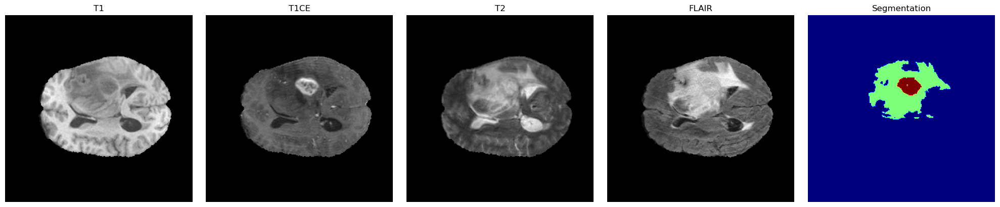

In [21]:
import os
import nibabel as nib
import matplotlib.pyplot as plt

# Define the function
def plot_sample_slices(case_folder, slice_idx=None):
    """Plot all modalities and segmentation for a given case"""
    modalities = ['t1', 't1ce', 't2', 'flair']
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    
    for idx, modality in enumerate(modalities):
        img_path = os.path.join(TRAIN_PATH, case_folder, f"{case_folder}_{modality}.nii")
        img = nib.load(img_path).get_fdata()
        
        if slice_idx is None:
            slice_idx = img.shape[2] // 2
            
        axes[idx].imshow(img[:, :, slice_idx], cmap='gray')
        axes[idx].set_title(f'{modality.upper()}')
        axes[idx].axis('off')
    
    # Plot segmentation
    seg_path = os.path.join(TRAIN_PATH, case_folder, f"{case_folder}_seg.nii")
    seg = nib.load(seg_path).get_fdata()
    axes[4].imshow(seg[:, :, slice_idx], cmap='jet')
    axes[4].set_title('Segmentation')
    axes[4].axis('off')
    
    plt.tight_layout()
    plt.show()

# Assuming TRAIN_PATH is defined and contains the path to your dataset folder
# Display example case
sample_case = 'BraTS20_Training_001'
print(f"Displaying sample case: {sample_case}")
plot_sample_slices(sample_case)


In [22]:
def SamplePlotting(cases, slice_idx=None):
    """Display each sample in a single row with all modalities and a segmentation overlay."""
    num_cases = len(cases)
    
    fig, axes = plt.subplots(num_cases, 5, figsize=(20, num_cases * 4))
    fig.suptitle("MRI Brain Tumor Segmentation Samples\nEach row represents a different case with T1, T1CE, T2, Flair, and Segmentation overlay", 
                 fontsize=16, weight='bold', y=1.02)
    
    for i, sample_case in enumerate(cases):
        modalities = ['t1', 't1ce', 't2', 'flair']
        case_folder = sample_case


        display_title = f"Case: {sample_case}"
        axes[i, 0].text(-0.1, 0.5, display_title, ha='right', va='center', fontsize=12, weight='bold', transform=axes[i, 0].transAxes)
        
        for j, modality in enumerate(modalities):
            img_path = os.path.join(TRAIN_PATH, case_folder, f"{case_folder}_{modality}.nii")
            img = nib.load(img_path).get_fdata()

            if slice_idx is None:
                slice_idx = img.shape[2] // 2  
            

            ax = axes[i, j]
            ax.imshow(img[:, :, slice_idx], cmap='gray')
            ax.set_title(f'{modality.upper()}', fontsize=10, weight='bold')
            ax.axis('off')
            

        seg_path = os.path.join(TRAIN_PATH, case_folder, f"{case_folder}_seg.nii")
        seg = nib.load(seg_path).get_fdata()
        
        ax = axes[i, 4]
        ax.imshow(img[:, :, slice_idx], cmap='gray')
        ax.imshow(seg[:, :, slice_idx], cmap='jet', alpha=0.3)
        ax.set_title('Segmentation Overlay', fontsize=10, weight='bold')
        ax.axis('off')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.subplots_adjust(top=0.93)
    plt.show()


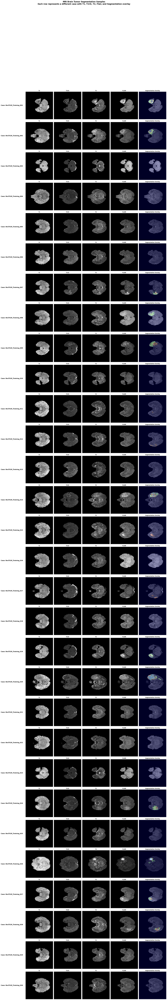

In [26]:
sample_cases = train_cases[:30] 
slice_idx = random.randint(40, 60) 

SamplePlotting(sample_cases, slice_idx=slice_idx)

Data Preprocessing
---

In [32]:
t2_list = sorted(glob.glob(r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\MICCAI_BraTS2020_TrainingData/*/*t2.nii'))
t1ce_list = sorted(glob.glob(r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\MICCAI_BraTS2020_TrainingData/*/*t1ce.nii'))
flair_list = sorted(glob.glob(r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\MICCAI_BraTS2020_TrainingData/*/*flair.nii'))
mask_list = sorted(glob.glob(r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\MICCAI_BraTS2020_TrainingData/*/*seg.nii'))

In [33]:
len(t2_list)

369

In [34]:
len(t1ce_list)

369

In [35]:
len(flair_list)

369

In [36]:
len(mask_list)

369

Adjusting The Labels
---

In [43]:
test_mask=nib.load(r"D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\MICCAI_BraTS2020_TrainingData\BraTS20_Training_355\BraTS20_Training_355_seg.nii").get_fdata()
test_mask=test_mask.astype(np.uint8)

print(np.unique(test_mask)) 
test_mask[test_mask==4] = 3 
print(np.unique(test_mask)) 

[0 1 2 4]

[0 1 2 3]


In [48]:
for img in range(len(t2_list)):   #Using t1_list as all lists are of same size
    print("Now preparing image and masks number: ", img)
      
    temp_image_t2=nib.load(t2_list[img]).get_fdata()
    temp_image_t2=scaler.fit_transform(temp_image_t2.reshape(-1, temp_image_t2.shape[-1])).reshape(temp_image_t2.shape)
   
    temp_image_t1ce=nib.load(t1ce_list[img]).get_fdata()
    temp_image_t1ce=scaler.fit_transform(temp_image_t1ce.reshape(-1, temp_image_t1ce.shape[-1])).reshape(temp_image_t1ce.shape)
   
    temp_image_flair=nib.load(flair_list[img]).get_fdata()
    temp_image_flair=scaler.fit_transform(temp_image_flair.reshape(-1, temp_image_flair.shape[-1])).reshape(temp_image_flair.shape)
        
    temp_mask=nib.load(mask_list[img]).get_fdata()
    temp_mask=temp_mask.astype(np.uint8)
    temp_mask[temp_mask==4] = 3  #Reassign mask values 4 to 3
    #print(np.unique(temp_mask))
    
    
    temp_combined_images = np.stack([temp_image_flair, temp_image_t1ce, temp_image_t2], axis=3)
    
    #Crop to a size to be divisible by 64 so we can later extract 64x64x64 patches. 
    #cropping x, y, and z
    temp_combined_images=temp_combined_images[56:184, 56:184, 13:141]
    temp_mask = temp_mask[56:184, 56:184, 13:141]
    
    val, counts = np.unique(temp_mask, return_counts=True)
    
    if (1 - (counts[0]/counts.sum())) > 0.01:  #At least 1% useful volume with labels that are not 0
        print("Saved")
        temp_mask= to_categorical(temp_mask, num_classes=4)
        np.save(r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/input_data_3channels/images/image_'+str(img)+'.npy', temp_combined_images)
        np.save(r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/input_data_3channels/masks/mask_'+str(img)+'.npy', temp_mask)
        
    else:
        print("Discarded")  

Now preparing image and masks number:  0

Saved

Now preparing image and masks number:  1

Saved

Now preparing image and masks number:  2

Saved

Now preparing image and masks number:  3

Saved

Now preparing image and masks number:  4

Discarded

Now preparing image and masks number:  5

Saved

Now preparing image and masks number:  6

Saved

Now preparing image and masks number:  7

Saved

Now preparing image and masks number:  8

Saved

Now preparing image and masks number:  9

Saved

Now preparing image and masks number:  10

Saved

Now preparing image and masks number:  11

Saved

Now preparing image and masks number:  12

Saved

Now preparing image and masks number:  13

Saved

Now preparing image and masks number:  14

Saved

Now preparing image and masks number:  15

Saved

Now preparing image and masks number:  16

Saved

Now preparing image and masks number:  17

Saved

Now preparing image and masks number:  18

Saved

Now preparing image and masks number:  19

Saved

Now pr

Train-Test Split
---

In [55]:
input_folder = r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\input_data_3channels'
output_folder = r'D:\projects\Computer vision\archive (1)\BraTS2020_TrainingData\Output2'

In [56]:
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(.75, .25), group_prefix=None)




Copying files: 0 files [00:00, ? files/s]

Copying files: 2 files [00:00,  4.24 files/s]

Copying files: 3 files [00:00,  3.25 files/s]

Copying files: 4 files [00:01,  2.88 files/s]

Copying files: 5 files [00:01,  2.70 files/s]

Copying files: 6 files [00:02,  2.63 files/s]

Copying files: 7 files [00:02,  2.57 files/s]

Copying files: 8 files [00:02,  2.50 files/s]

Copying files: 9 files [00:03,  2.46 files/s]

Copying files: 10 files [00:07,  1.66s/ files]

Copying files: 11 files [00:09,  1.71s/ files]

Copying files: 12 files [00:10,  1.48s/ files]

Copying files: 13 files [00:12,  1.57s/ files]

Copying files: 14 files [00:14,  1.69s/ files]

Copying files: 15 files [00:15,  1.46s/ files]

Copying files: 16 files [00:15,  1.21s/ files]

Copying files: 17 files [00:16,  1.03 files/s]

Copying files: 18 files [00:17,  1.05 files/s]

Copying files: 19 files [00:18,  1.10 files/s]

Copying files: 20 files [00:18,  1.19 files/s]

Copying files: 21 files [00:20,  1.04s/ files]

Cop

In [16]:
def load_img(img_dir: str, img_list: List[str]) -> np.ndarray:
    """
    Load multiple .npy image files from a directory into a numpy array.

    Parameters:
    -----------
    img_dir : str
        Directory path containing the image files
        Example: '/path/to/images/'
    
    img_list : List[str]
        List of image filenames to load
        Example: ['img1.npy', 'img2.npy', 'img3.npy']

    Returns:
    --------
    np.ndarray
        A numpy array containing all loaded images
        Shape: (n_images, height, width, channels) or (n_images, height, width) for grayscale

    Examples:
    --------
    >>> img_directory = '/data/training/images/'
    >>> image_files = ['i1.npy', 'i2.npy']
    >>> loaded_images = load_img(img_directory, image_files)

    Notes:
    ------
    - Only processes .npy files
    - Assumes all images have the same dimensions
    - Loads all specified images into memory at once
    """
    # Initialize empty list to store images
    images = []
    
    # Iterate through each image name in the provided list
    for i, image_name in enumerate(img_list):    
        # Check if the file is a .npy file
        if (image_name.split('.')[1] == 'npy'):
            # Load the image using numpy
            image = np.load(img_dir + image_name)
            # Add the loaded image to our list
            images.append(image)
    
    # Convert list of images to numpy array for batch processing
    images = np.array(images)
    
    return(images)

def imageLoader(img_dir, img_list, mask_dir, mask_list, batch_size):
    """
    Generate batches of image and mask pairs for training deep learning models.
    Creates an infinite generator compatible with Keras training API.

    Parameters:
    -----------
    img_dir : str
        Directory containing the input images
        Example: '/path/to/images/'
    
    img_list : List[str]
        List of input image filenames
        Example: ['img1.npy', 'img2.npy']
    
    mask_dir : str
        Directory containing the mask images
        Example: '/path/to/masks/'
    
    mask_list : List[str]
        List of mask filenames
        Example: ['mask1.npy', 'mask2.npy']
    
    batch_size : int
        Number of images per batch
        Example: 32

    Yields:
    -------
    Tuple[np.ndarray, np.ndarray]
        A tuple containing:
        - Batch of input images: shape (batch_size, height, width, channels)
        - Batch of corresponding masks: shape (batch_size, height, width)

    Notes:
    ------
    - Creates an infinite generator (required by Keras)
    - Loads images and masks in synchronized batches
    - Memory efficient: only loads batch_size images at a time
    - Assumes images and masks are paired and ordered correctly
    - Only processes .npy files
    """
   
    L = len(img_list)
    while True:
        # Initialize batch indices
        batch_start = 0
        batch_end = batch_size
        
        # Loop through the entire dataset in batches
        while batch_start < L:
            # Handle the case where batch_end exceeds dataset size
            limit = min(batch_end, L)
            
            # Load current batch of images and masks
            X = load_img(img_dir, img_list[batch_start:limit])
            Y = load_img(mask_dir, mask_list[batch_start:limit])
            
            # Yield the batch as a tuple of numpy arrays
            yield (X,Y)
            
            # Update batch indices
            batch_start += batch_size   
            batch_end += batch_size


In [17]:
def load_img(img_dir: str, img_list: List[str], is_mask: bool = False) -> np.ndarray:
    """
    Load multiple .npy image files from a directory into a numpy array.
    
    Parameters:
    -----------
    img_dir : str
        Directory path containing the files
    img_list : List[str]
        List of filenames to load
    is_mask : bool
        Whether the loaded file is a mask (to handle categorical data properly)
    """
    images = []
    
    for image_name in img_list:    
        if image_name.split('.')[1] == 'npy':
            # Load the image
            image = np.load(img_dir + image_name)
            
            # Convert to float32
            image = image.astype(np.float32)
            
            images.append(image)
    
    return np.array(images, dtype=np.float32)

def imageLoader(img_dir, img_list, mask_dir, mask_list, batch_size):
    """
    Generate batches of image and mask pairs.
    Handles masks that are already in categorical format.
    """
    L = len(img_list)
    
    while True:
        batch_start = 0
        batch_end = batch_size
        
        while batch_start < L:
            limit = min(batch_end, L)
            
            # Load images and masks
            X = load_img(img_dir, img_list[batch_start:limit])
            Y = load_img(mask_dir, mask_list[batch_start:limit], is_mask=True)
            
            # No need for categorical conversion since masks are already categorical
            
            yield (X, Y)
            
            batch_start += batch_size   
            batch_end += batch_size


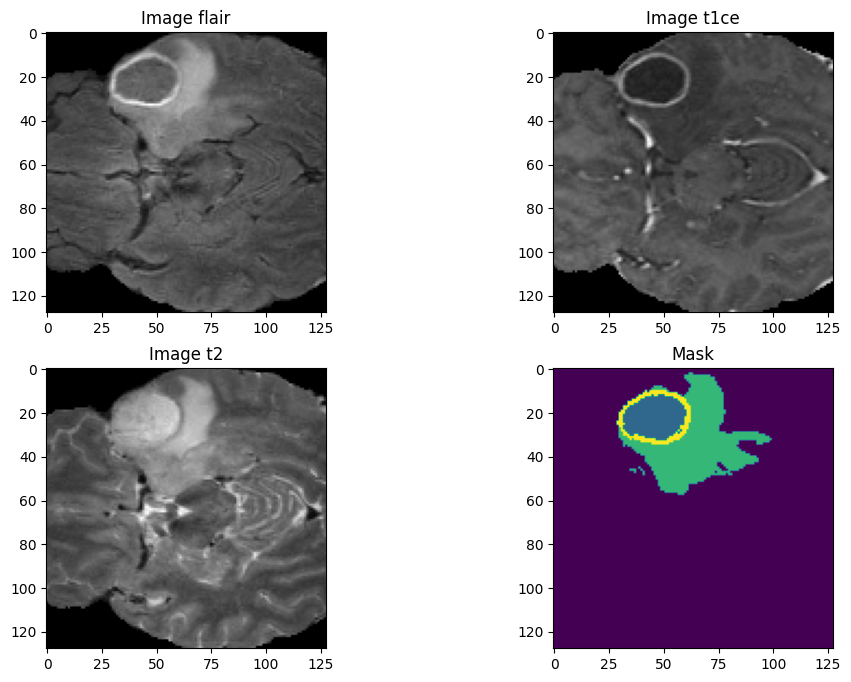

In [18]:
#train_img_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/train/images/'
#train_mask_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/train/masks/'
train_img_dir ='/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/train/images/'
train_mask_dir='/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/train/masks/'
train_img_list = sorted(os.listdir('/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/train/images'))
train_mask_list = sorted(os.listdir('/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/train/masks'))


batch_size = 2

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)
img, msk = train_img_datagen.__next__()


img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=np.argmax(test_mask, axis=3)

n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()

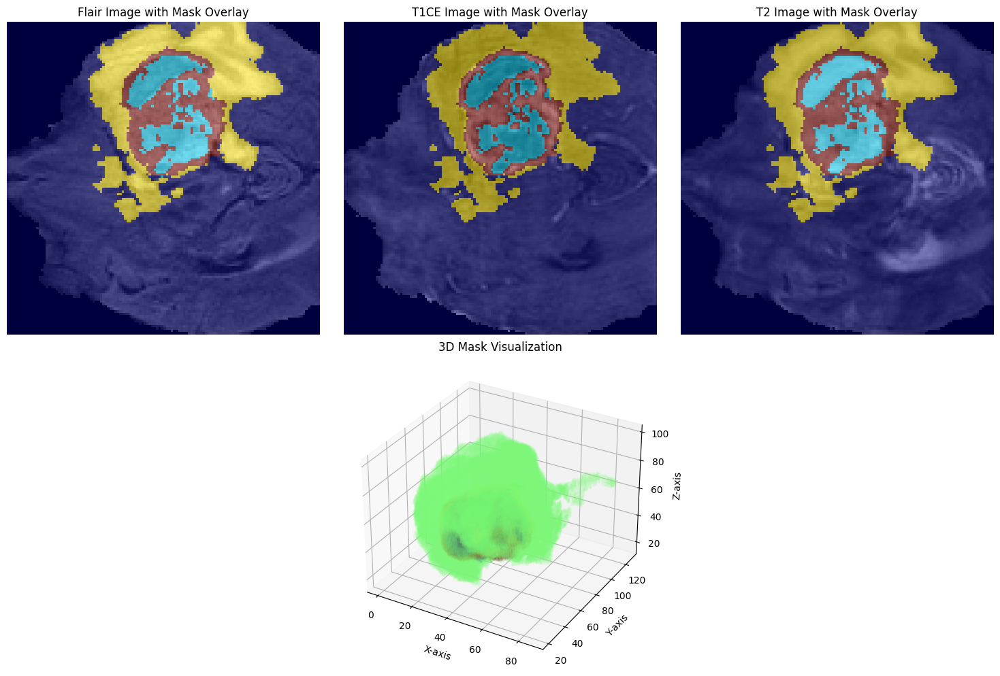

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import random

# Assuming `imageLoader` function and `train_img_datagen` as per your setup
train_img_datagen = imageLoader(train_img_dir, train_img_list, train_mask_dir, train_mask_list, batch_size)
img, msk = train_img_datagen.__next__()

# Select a random image and mask from the batch
img_num = random.randint(0, img.shape[0] - 1)
test_img = img[img_num]
test_mask = msk[img_num]
test_mask = np.argmax(test_mask, axis=3)

# Select a random slice index to display
n_slice = random.randint(0, test_mask.shape[2])

# Plotting
fig = plt.figure(figsize=(15, 10))

# Subplot 1: Flair Image with Mask Overlay
ax1 = fig.add_subplot(231)
ax1.imshow(test_img[:, :, n_slice, 0], cmap='gray')
ax1.imshow(test_mask[:, :, n_slice], cmap='jet', alpha=0.5)  # Overlay mask with transparency
ax1.set_title('Flair Image with Mask Overlay')
ax1.axis('off')

# Subplot 2: T1CE Image with Mask Overlay
ax2 = fig.add_subplot(232)
ax2.imshow(test_img[:, :, n_slice, 1], cmap='gray')
ax2.imshow(test_mask[:, :, n_slice], cmap='jet', alpha=0.5)  # Overlay mask with transparency
ax2.set_title('T1CE Image with Mask Overlay')
ax2.axis('off')

# Subplot 3: T2 Image with Mask Overlay
ax3 = fig.add_subplot(233)
ax3.imshow(test_img[:, :, n_slice, 2], cmap='gray')
ax3.imshow(test_mask[:, :, n_slice], cmap='jet', alpha=0.5)  # Overlay mask with transparency
ax3.set_title('T2 Image with Mask Overlay')
ax3.axis('off')

# 3D Plot: Brain and Mask in 3D
ax4 = fig.add_subplot(212, projection='3d')
x, y, z = np.where(test_mask > 0)  # Only plot segmented mask areas

# Scatter plot for the 3D mask regions
ax4.scatter(x, y, z, c=test_mask[test_mask > 0], cmap='jet', alpha=0.1, s=1)
ax4.set_title("3D Mask Visualization")
ax4.set_xlabel("X-axis")
ax4.set_ylabel("Y-axis")
ax4.set_zlabel("Z-axis")

plt.tight_layout()
plt.show()


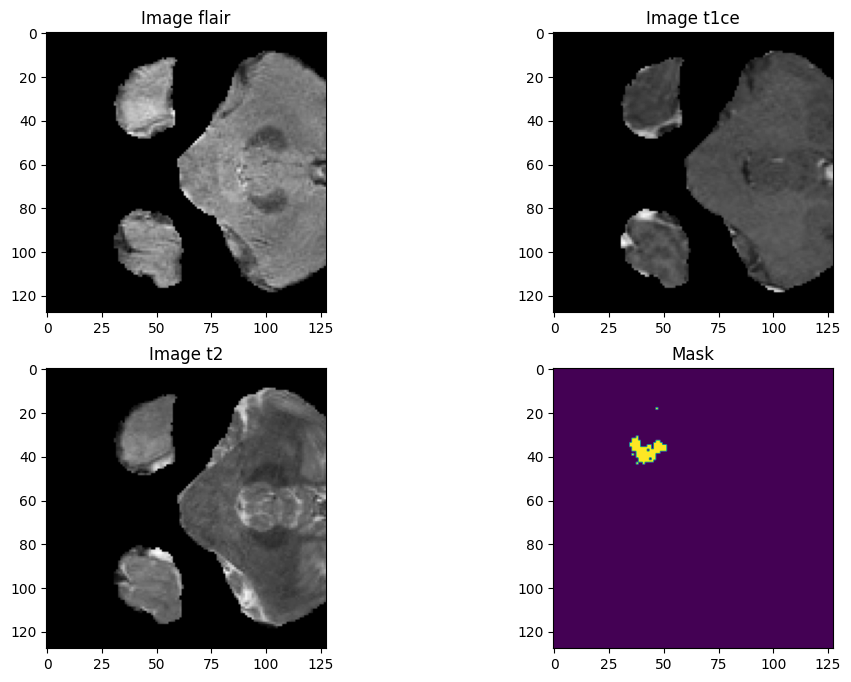

In [20]:
batch_size =4 

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)
img, msk = train_img_datagen.__next__()


img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=np.argmax(test_mask, axis=3)

n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()

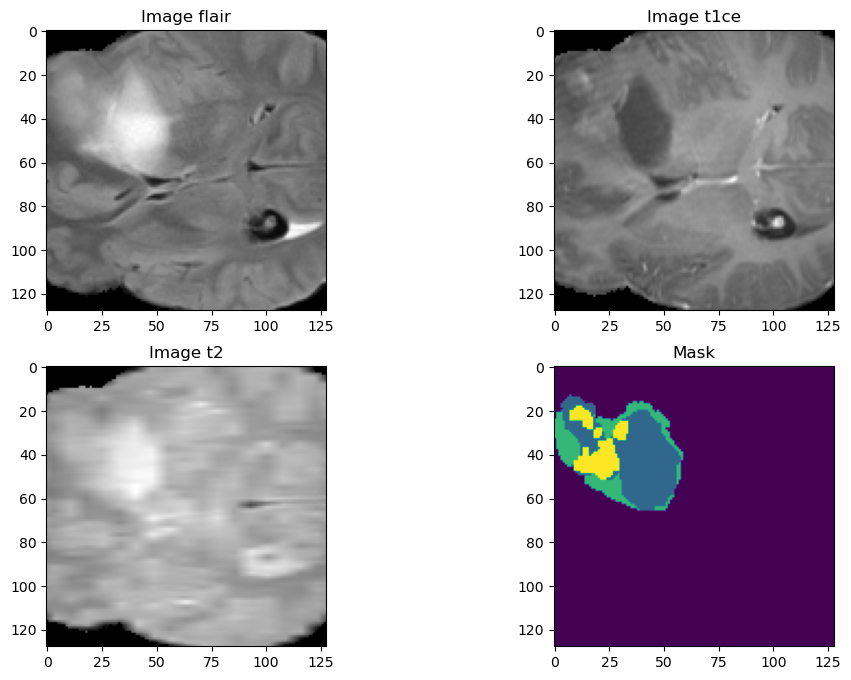

In [87]:
#شغال ولا لا
train_img_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/train/images/'
train_mask_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/train/masks/'
img_list = os.listdir(train_img_dir)
msk_list = os.listdir(train_mask_dir)

num_images = len(os.listdir(train_img_dir))

img_num = random.randint(0,num_images-1)
test_img = np.load(train_img_dir+img_list[img_num])
test_mask = np.load(train_mask_dir+msk_list[img_num])
test_mask = np.argmax(test_mask, axis=3)

n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()


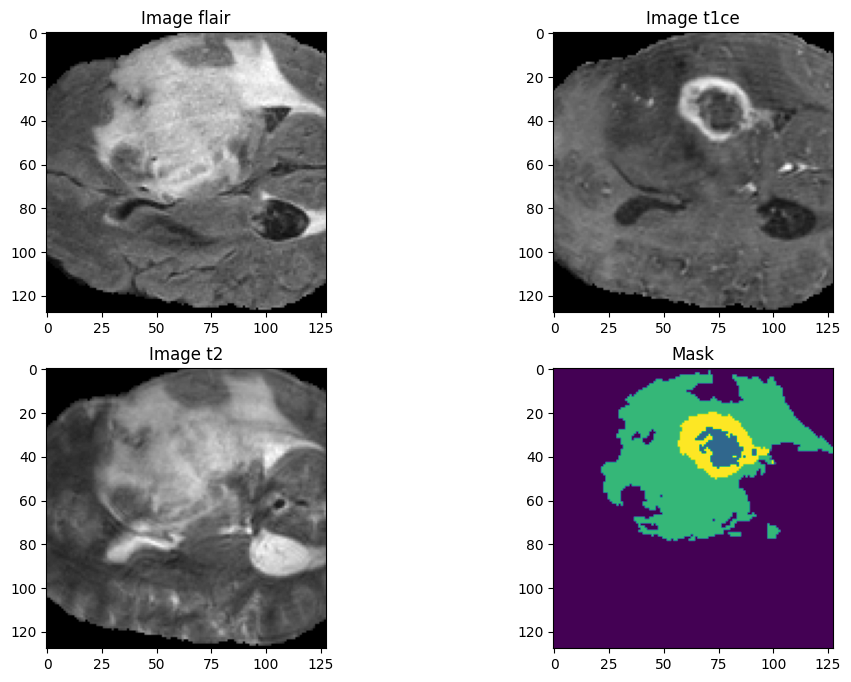

In [21]:
batch_size = 2
val_img_dir ='/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/val/images/'
val_mask_dir='/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/val/masks/'
val_img_list = sorted(os.listdir('/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/val/images'))
val_mask_list = sorted(os.listdir('/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/val/masks'))


train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

train_img_list=sorted(os.listdir(train_img_dir))
train_mask_list = sorted(os.listdir(train_mask_dir))

val_img_list=sorted(os.listdir(val_img_dir))
val_mask_list = sorted(os.listdir(val_mask_dir))

batch_size = 4

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)


img, msk = train_img_datagen.__next__()

img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=np.argmax(test_mask, axis=3)

n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()


In [2]:
import os
import random
from sklearn.model_selection import train_test_split

# Base directories
base_dir = '/kaggle/input/3d-mri-brain-tumor-segmentation/Output2/'
val_img_dir = os.path.join(base_dir, 'val/images/')
val_mask_dir = os.path.join(base_dir, 'val/masks/')

# Get validation image and mask lists
val_img_list = os.listdir(val_img_dir)
val_mask_list = os.listdir(val_mask_dir)

# Take a small portion for testing BEFORE training
num_test_samples = 20  # Adjust this number as needed
val_img_list, test_img_list, val_mask_list, test_mask_list = train_test_split(
    val_img_list, val_mask_list,
    test_size=num_test_samples,
    random_state=42
)

# Create data generators with the REDUCED validation set
batch_size = 2
train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                              train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader(val_img_dir, val_img_list, 
                            val_mask_dir, val_mask_list, batch_size)

test_img_datagen = imageLoader(val_img_dir, test_img_list, 
                             val_mask_dir, test_mask_list, batch_size)

# Calculate steps
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size
test_steps = len(test_img_list)//batch_size

# Training with the reduced validation set
history = model.fit(
    train_img_datagen,
    steps_per_epoch=steps_per_epoch,
    epochs=100,
    verbose=1,
    validation_data=val_img_datagen,  # Using reduced validation set
    validation_steps=val_steps_per_epoch,
    callbacks=callbacks
)

# After training, evaluate on the completely unseen test set
#test_results = model.evaluate(test_img_datagen, steps=test_steps)

print(f"Number of validation images (used during training): {len(val_img_list)}")
print(f"Number of test images (completely unseen): {len(test_img_list)}")

3


In [32]:
kernel_initializer =  'he_uniform'


In [29]:
def unet3D_model(IMG_HEIGHT, IMG_WIDTH, IMG_DEPTH, IMG_CHANNELS, num_classes):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_DEPTH, IMG_CHANNELS))
    s = inputs
    c1 = Conv3D(16, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv3D(16, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c1)
    p1 = MaxPooling3D((2, 2, 2))(c1)
    c2 = Conv3D(32, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv3D(32, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c2)
    p2 = MaxPooling3D((2, 2, 2))(c2)
    c3 = Conv3D(64, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv3D(64, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c3)
    p3 = MaxPooling3D((2, 2, 2))(c3)
    c4 = Conv3D(128, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv3D(128, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c4)
    p4 = MaxPooling3D(pool_size=(2, 2, 2))(c4)
    c5 = Conv3D(256, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv3D(256, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c5)
    u6 = Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv3D(128, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv3D(128, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c6)
    u7 = Conv3DTranspose(64, (2, 2, 2), strides=(2, 2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv3D(64, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv3D(64, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c7)
    u8 = Conv3DTranspose(32, (2, 2, 2), strides=(2, 2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv3D(32, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv3D(32, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c8)
    u9 = Conv3DTranspose(16, (2, 2, 2), strides=(2, 2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv3D(16, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv3D(16, (3, 3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c9)
     
    outputs = Conv3D(num_classes, (1, 1, 1), activation='softmax')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
    model.summary()
    
    return model


In [22]:
def unet3D_model(IMG_HEIGHT, IMG_WIDTH, IMG_DEPTH, IMG_CHANNELS, num_classes):
    # Ensure input shape uses float32
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_DEPTH, IMG_CHANNELS), dtype='float32')
    
    # Contraction path
    def conv_block(inputs, filters, dropout_rate=0.1):
        x = Conv3D(filters, (3, 3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(inputs)
        x = Dropout(dropout_rate)(x)
        x = Conv3D(filters, (3, 3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(x)
        return x
    
    # Encoder
    c1 = conv_block(inputs, 16)
    p1 = MaxPooling3D((2, 2, 2))(c1)
    
    c2 = conv_block(p1, 32)
    p2 = MaxPooling3D((2, 2, 2))(c2)
    
    c3 = conv_block(p2, 64, dropout_rate=0.2)
    p3 = MaxPooling3D((2, 2, 2))(c3)
    
    c4 = conv_block(p3, 128, dropout_rate=0.2)
    p4 = MaxPooling3D((2, 2, 2))(c4)
    
    # Bridge
    c5 = conv_block(p4, 256, dropout_rate=0.3)
    
    # Decoder
    def up_block(inputs, skip_connection, filters, dropout_rate=0.2):
        up = Conv3DTranspose(filters, (2, 2, 2), strides=(2, 2, 2), padding='same')(inputs)
        merge = concatenate([up, skip_connection])
        x = conv_block(merge, filters, dropout_rate)
        return x
    
    u6 = up_block(c5, c4, 128)
    u7 = up_block(u6, c3, 64)
    u8 = up_block(u7, c2, 32, dropout_rate=0.1)
    u9 = up_block(u8, c1, 16, dropout_rate=0.1)
    
    # Output layer
    outputs = Conv3D(num_classes, (1, 1, 1), activation='softmax')(u9)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [23]:
model = unet3D_model(128, 128, 128, 3, 4)
print(model.input_shape)


(None, 128, 128, 128, 3)
(None, 128, 128, 128, 4)


In [24]:
print(model.output_shape)

(None, 128, 128, 128, 4)


In [30]:
plot_model(model, to_file="unet_model.png", show_shapes=True, show_layer_names=True, expand_nested=True)


In [116]:
pip install pydot

Defaulting to user installation because normal site-packages is not writeable







Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\programdata\anaconda3\lib\site-packages\vboxapi-1.0-py3.12.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330


In [33]:
import segmentation_models_3D as sm
dice_loss = sm.losses.DiceLoss() 
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

metrics = ['accuracy', sm.metrics.IOUScore(threshold=0.5)]

LR = 0.0001
optim = keras.optimizers.Adam(LR)
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size
model =unet3D_model(IMG_HEIGHT=128, 
                          IMG_WIDTH=128, 
                          IMG_DEPTH=128, 
                          IMG_CHANNELS=3, 
                          num_classes=4)

model.compile(optimizer = optim, loss=total_loss, metrics=metrics)
print(model.summary())

print(model.input_shape)
print(model.output_shape)

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 128, 3)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_38 (Conv3D)  │ (None, 128, 128,  │      1,312 │ input_layer_3[0]… │
│                     │ 128, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_18          │ (None, 128, 128,  │          0 │ conv3d_38[0][0]   │
│ (Dropout)           │ 128, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_39 (Conv3D)  │ (None, 128, 128,  │      6,928 │ dropout_18[0][0]  │
│                     │ 128, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_8     │ (None, 64, 64,    │          0 │ conv3d_39[0][0]   │
│ (MaxPooling3D)      │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_40 (Conv3D)  │ (None, 64, 64,    │     13,856 │ max_pooling3d_8[… │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_19          │ (None, 64, 64,    │          0 │ conv3d_40[0][0]   │
│ (Dropout)           │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_41 (Conv3D)  │ (None, 64, 64,    │     27,680 │ dropout_19[0][0]  │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_9     │ (None, 32, 32,    │          0 │ conv3d_41[0][0]   │
│ (MaxPooling3D)      │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_42 (Conv3D)  │ (None, 32, 32,    │     55,360 │ max_pooling3d_9[… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_20          │ (None, 32, 32,    │          0 │ conv3d_42[0][0]   │
│ (Dropout)           │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_43 (Conv3D)  │ (None, 32, 32,    │    110,656 │ dropout_20[0][0]  │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_10    │ (None, 16, 16,    │          0 │ conv3d_43[0][0]   │
│ (MaxPooling3D)      │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_44 (Conv3D)  │ (None, 16, 16,    │    221,312 │ max_pooling3d_10… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 16, 16,    │          0 │ conv3d_44[0][0]   │
│ (Dropout)           │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_45 (Conv3D)  │ (None, 16, 16,    │    442,496 │ dropout_21[0][0]  │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_11    │ (None, 8, 8, 8,   │          0 │ conv3d_45[0][0] 

 Total params: 5,645,828 (21.54 MB)

 Trainable params: 5,645,828 (21.54 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 128, 3)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_38 (Conv3D)  │ (None, 128, 128,  │      1,312 │ input_layer_3[0]… │
│                     │ 128, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_18          │ (None, 128, 128,  │          0 │ conv3d_38[0][0]   │
│ (Dropout)           │ 128, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_39 (Conv3D)  │ (None, 128, 128,  │      6,928 │ dropout_18[0][0]  │
│                     │ 128, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_8     │ (None, 64, 64,    │          0 │ conv3d_39[0][0]   │
│ (MaxPooling3D)      │ 64, 16)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_40 (Conv3D)  │ (None, 64, 64,    │     13,856 │ max_pooling3d_8[… │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_19          │ (None, 64, 64,    │          0 │ conv3d_40[0][0]   │
│ (Dropout)           │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_41 (Conv3D)  │ (None, 64, 64,    │     27,680 │ dropout_19[0][0]  │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_9     │ (None, 32, 32,    │          0 │ conv3d_41[0][0]   │
│ (MaxPooling3D)      │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_42 (Conv3D)  │ (None, 32, 32,    │     55,360 │ max_pooling3d_9[… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_20          │ (None, 32, 32,    │          0 │ conv3d_42[0][0]   │
│ (Dropout)           │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_43 (Conv3D)  │ (None, 32, 32,    │    110,656 │ dropout_20[0][0]  │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_10    │ (None, 16, 16,    │          0 │ conv3d_43[0][0]   │
│ (MaxPooling3D)      │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_44 (Conv3D)  │ (None, 16, 16,    │    221,312 │ max_pooling3d_10… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 16, 16,    │          0 │ conv3d_44[0][0]   │
│ (Dropout)           │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_45 (Conv3D)  │ (None, 16, 16,    │    442,496 │ dropout_21[0][0]  │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_11    │ (None, 8, 8, 8,   │          0 │ conv3d_45[0][0] 

 Total params: 5,645,828 (21.54 MB)

 Trainable params: 5,645,828 (21.54 MB)

 Non-trainable params: 0 (0.00 B)

None
(None, 128, 128, 128, 3)
(None, 128, 128, 128, 4)


In [27]:
pip install segmentation_models_3D

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 2.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [34]:
callbacks = [
    # Early stopping to prevent overfitting
    EarlyStopping(
        monitor='val_loss',
        patience=15,  # Number of epochs to wait before stopping if no improvement
        restore_best_weights=True,  # Restore model weights from the epoch with the best value
        verbose=1,
        mode='min'
    ),
    
    ModelCheckpoint(
        'best_model.keras',  # Changed from .h5 to .keras
        monitor='val_loss',
        save_best_only=True,
        mode='min',
        verbose=1
    ),
    
    # Reduce learning rate when metrics plateau
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,  # Reduce LR by 20% when plateauing
        patience=5,
        min_lr=1e-6,
        verbose=1
    )
]



In [35]:
history = model.fit(
    train_img_datagen,
    steps_per_epoch=steps_per_epoch,
    epochs=100,
    verbose=1,
    validation_data=val_img_datagen,
    validation_steps=val_steps_per_epoch,
    callbacks=callbacks
)

Epoch 1/100


I0000 00:00:1730370296.038244     187 service.cc:145] XLA service 0x7ce6c80250a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730370296.038310     187 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1730370296.038315     187 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2024-10-31 10:25:08.809742: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[4,16,128,128,128]{4,3,2,1,0}, u8[0]{0}) custom-call(f32[4,16,128,128,128]{4,3,2,1,0}, f32[16,16,3,3,3]{4,3,2,1,0}, f32[16]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kRelu","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-10-

63/64 ━━━━━━━━━━━━━━━━━━━━ 2s 3s/step - accuracy: 0.3250 - iou_score: 0.0412 - loss: 0.9145

2024-10-31 10:29:42.094246: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[2,16,128,128,128]{4,3,2,1,0}, u8[0]{0}) custom-call(f32[2,32,128,128,128]{4,3,2,1,0}, f32[16,32,3,3,3]{4,3,2,1,0}, f32[16]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kRelu","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-10-31 10:29:42.289778: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.195630797s
Trying algorithm eng0{} for conv (f32[2,16,128,128,128]{4,3,2,1,0}, u8[0]{0}) custom-call(f32[2,32,128,128,128]{4,3,2,1,0}, f32[16,32,3,3,3]{4,3,2,1,0}, f32[16]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActivationForward

64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3296 - iou_score: 0.0423 - loss: 0.9138
Epoch 1: val_loss improved from inf to 0.79974, saving model to best_model.keras
64/64 ━━━━━━━━━━━━━━━━━━━━ 406s 5s/step - accuracy: 0.3340 - iou_score: 0.0433 - loss: 0.9131 - val_accuracy: 0.9486 - val_iou_score: 0.2331 - val_loss: 0.7997 - learning_rate: 1.0000e-04
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9453 - iou_score: 0.2327 - loss: 0.7729
Epoch 2: val_loss improved from 0.79974 to 0.74222, saving model to best_model.keras
64/64 ━━━━━━━━━━━━━━━━━━━━ 238s 4s/step - accuracy: 0.9453 - iou_score: 0.2327 - loss: 0.7727 - val_accuracy: 0.9500 - val_iou_score: 0.2037 - val_loss: 0.7422 - learning_rate: 1.0000e-04
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9495 - iou_score: 0.2343 - loss: 0.7194
Epoch 3: val_loss improved from 0.74222 to 0.66523, saving model to best_model.keras
64/64 ━━━━━━━━━━━━━━━━━━━━ 247s 4s/step - accuracy: 0.9495 - iou_score: 0

# **PLOTTING MODEL'S PERFORMANCE METRICS**

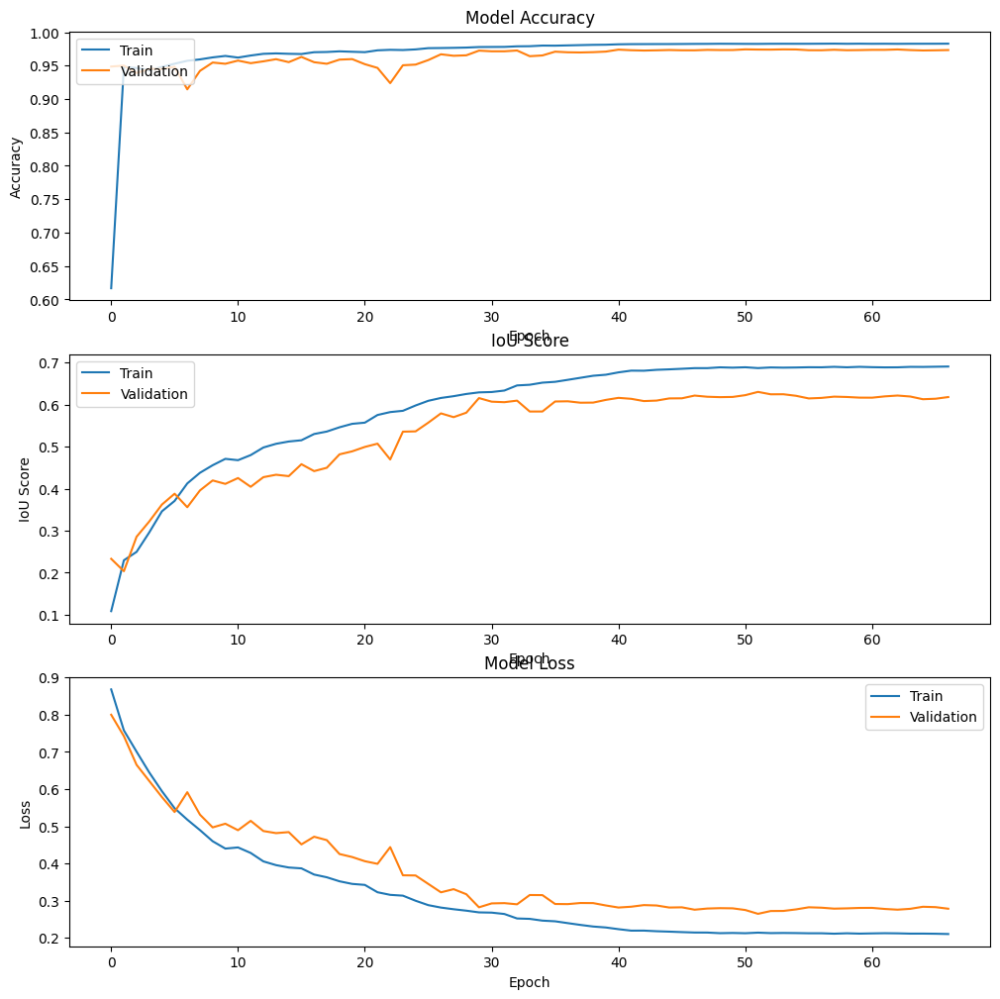

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 12))
# Accuracy
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model Accuracy')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend(['Train', 'Validation'], loc='upper left')

# IoU Score
ax2.plot(history.history['iou_score'])
ax2.plot(history.history['val_iou_score'])
ax2.set_title('IoU Score')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('IoU Score')
ax2.legend(['Train', 'Validation'], loc='upper left')

# Loss
ax3.plot(history.history['loss'])
ax3.plot(history.history['val_loss'])
ax3.set_title('Model Loss')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Loss')
ax3.legend(['Train', 'Validation'], loc='upper right')

plt.show()

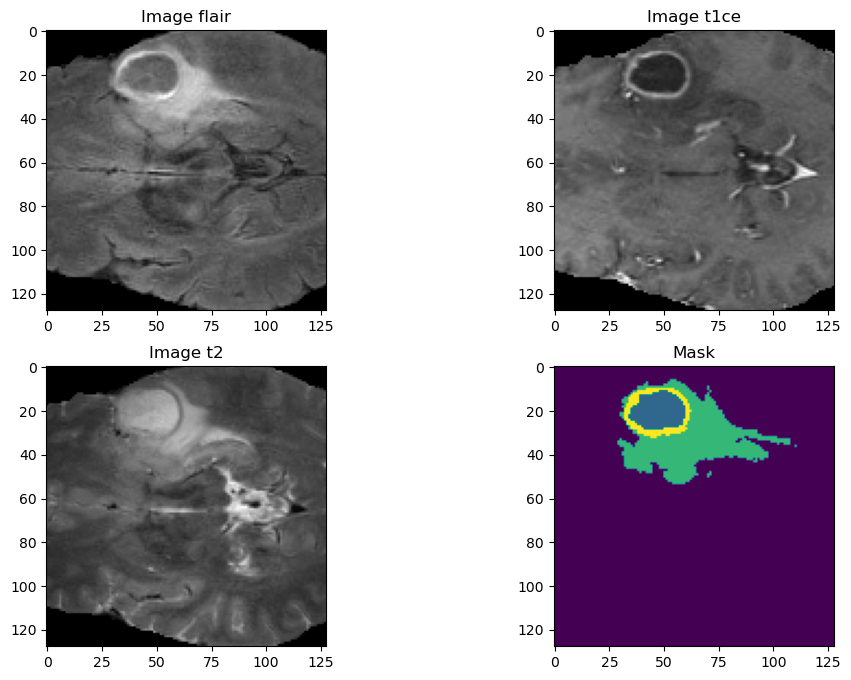

In [138]:
train_img_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/train/images/'
train_mask_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/train/masks/'

val_img_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/val/images/'
val_mask_dir = r'D:/projects/Computer vision/archive (1)/BraTS2020_TrainingData/Output2/val/masks/'

train_img_list=os.listdir(train_img_dir)
train_mask_list = os.listdir(train_mask_dir)

val_img_list=os.listdir(val_img_dir)
val_mask_list = os.listdir(val_mask_dir)
##################################

########################################################################
batch_size = 2

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
img, msk = train_img_datagen.__next__()

img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=np.argmax(test_mask, axis=3)

n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()


In [145]:
import numpy as np

def test_data_generator(generator, num_batches=2):
    """
    Test a data generator to ensure it's producing valid data in the expected format.
    
    Args:
        generator: The data generator to test
        num_batches: Number of batches to test (default: 2)
    
    Returns:
        bool: True if all tests pass, False otherwise
    """
    print("Testing data generator...")
    
    try:
        for batch_idx in range(num_batches):
            print(f"\nTesting batch {batch_idx + 1}/{num_batches}")
            
            # Get a batch from the generator
            try:
                batch_data = next(generator)
            except StopIteration:
                print("❌ Error: Generator stopped before producing requested batches")
                return False
            except Exception as e:
                print(f"❌ Error getting batch: {str(e)}")
                return False
            
            # Check if batch_data is a tuple
            if not isinstance(batch_data, tuple):
                print(f"❌ Error: Generator should return a tuple, got {type(batch_data)}")
                return False
            
            # Check if we have both images and masks
            if len(batch_data) != 2:
                print(f"❌ Error: Generator should return tuple of length 2, got length {len(batch_data)}")
                return False
            
            X, Y = batch_data
            
            # Check if X and Y are numpy arrays
            if not isinstance(X, np.ndarray):
                print(f"❌ Error: X should be numpy array, got {type(X)}")
                return False
            if not isinstance(Y, np.ndarray):
                print(f"❌ Error: Y should be numpy array, got {type(Y)}")
                return False
            
            # Print shape information
            print(f"✓ X shape: {X.shape}")
            print(f"✓ Y shape: {Y.shape}")
            
            # Check if arrays contain valid numerical data
            if not np.isfinite(X).all():
                print("❌ Error: X contains invalid values (inf or nan)")
                return False
            if not np.isfinite(Y).all():
                print("❌ Error: Y contains invalid values (inf or nan)")
                return False
            
            # Print value ranges
            print(f"✓ X value range: [{X.min():.3f}, {X.max():.3f}]")
            print(f"✓ Y value range: [{Y.min():.3f}, {Y.max():.3f}]")
            
        print("\n✅ All tests passed successfully!")
        return True
        
    except Exception as e:
        print(f"\n❌ Unexpected error during testing: {str(e)}")
        return False

In [147]:
test_data_generator(train_img_datagen)
test_data_generator(val_img_datagen)

Testing data generator...



Testing batch 1/2

✓ X shape: (2, 128, 128, 128, 3)

✓ Y shape: (2, 128, 128, 128, 4)

✓ X value range: [0.000, 1.000]

✓ Y value range: [0.000, 1.000]



Testing batch 2/2

✓ X shape: (2, 128, 128, 128, 3)

✓ Y shape: (2, 128, 128, 128, 4)

✓ X value range: [0.000, 1.000]

✓ Y value range: [0.000, 1.000]



✅ All tests passed successfully!

Testing data generator...



Testing batch 1/2

✓ X shape: (2, 128, 128, 128, 3)

✓ Y shape: (2, 128, 128, 128, 4)

✓ X value range: [0.000, 1.000]

✓ Y value range: [0.000, 1.000]



Testing batch 2/2

✓ X shape: (2, 128, 128, 128, 3)

✓ Y shape: (2, 128, 128, 128, 4)

✓ X value range: [0.000, 1.000]

✓ Y value range: [0.000, 1.000]



✅ All tests passed successfully!


True